# Traitement de données audio en Python

## Analyses avec le package [librosa](https://github.com/librosa/librosa)

librosa est une bibliothèque d’analyse de données audio et plus particulièrement de musique. librosa repose sur `numpy` et `scipy`.

## Lire un fichier audio

Pour lire un fichier audio avec `librosa` on fait appel à la classe `Audio` du module `display` de IPython

In [62]:
import librosa
import numpy as np
from IPython.display import Audio

# la fonction load (https://librosa.org/doc/latest/generated/librosa.load.html#librosa.load) renvoie un tuple
# avec deux variables : 
# - y: les données
# - sr: sampling rate (taux d’échantillonnage)
#y, sr = librosa.load("../audio/electric_cello.wav")
#y, sr = librosa.load("../audio/choir_chant.wav")
#y, sr = librosa.load(librosa.ex('choice'))
#y, sr = librosa.load(librosa.ex('vibeace'))
#y, sr = librosa.load(librosa.ex('fishin'))

Audio(data=y, rate=sr)

Les données (les *samples*) sont des objets de type `ndarray` de numpy.  
Ici un tableau de float à une dimension

In [230]:
print(f"Type de y : {type(y)}")
print(f"Type du 1er élément du tableau : {type(y[0])}")

Type de y : <class 'numpy.ndarray'>
Type du 1er élément du tableau : <class 'numpy.float32'>


## Visualisations

Les visualisations se font à l’aide de la librairie `matplotlib`

### waveform

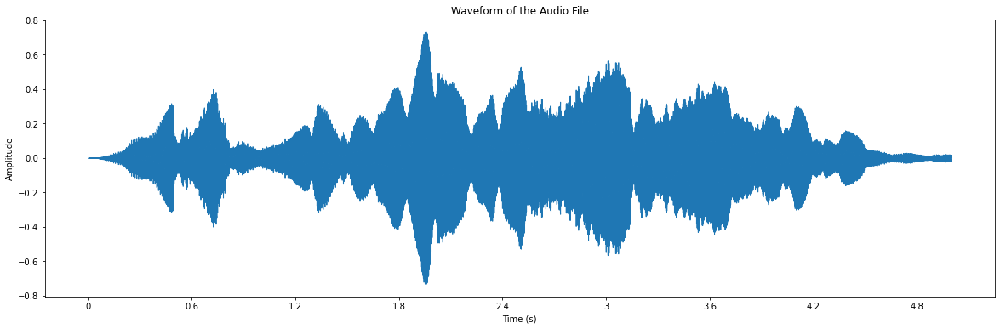

In [231]:
import matplotlib.pyplot as plt

y, sr = librosa.load("../audio/electric_cello.wav", duration=5)

plt.figure(figsize=(20, 6))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform of the Audio File')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

### Spectrogramme

In [233]:
# Génération du spectrogramme

D = librosa.stft(y)  # STFT (short-time Fourier Transform) 
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

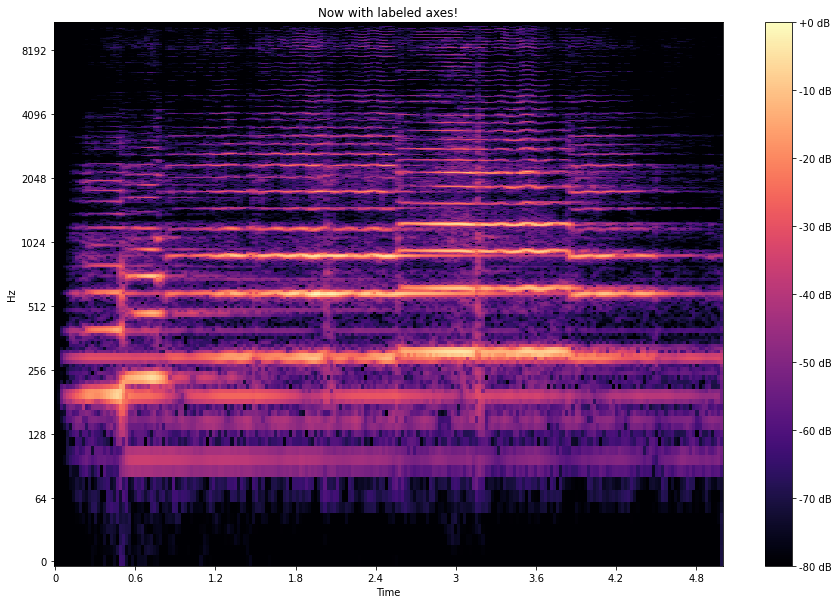

In [234]:
# Visualisation 

fig, ax = plt.subplots(figsize=(15,10))
img = librosa.display.specshow(S_db, x_axis='time', y_axis='log', ax=ax)
ax.set(title='Now with labeled axes!')
fig.colorbar(img, ax=ax, format="%+2.f dB")


## Écouter à l’envers

In [125]:
y, sr = librosa.load("../audio/electric_cello.wav")

# Inverser le signal
y_inverted = y[::-1]

display(Audio(y_inverted, rate=sr))

C’est un peu étrange. Encore plus étrange on peut créer un signal stéréo avec un canal à l’endroit et un canal à l’envers (à écouter au casque si possible)

In [132]:
# Charger l'audio stéréo
y, sr = librosa.load("../audio/electric_cello.wav", mono=False)
#y, sr = librosa.load("../audio/choir_chant.wav", mono=False)

# Séparer les canaux (gauche et droit)
y_left = y[0]  # Canal gauche (normal)
y_right = y[1]  # Canal droit (inversé)

# Vérifier les dimensions de y
print("Dimensions de y:", y.shape)  # Cela devrait être (2, n_samples) pour un signal stéréo

# Séparer les canaux (gauche et droit)
y_left = y[0]  # Canal gauche
y_right = y[1]  # Canal droit 

# Inverser le canal droit
y_right_inverted = y_right[::-1]

# Vérifier les dimensions des canaux séparés
print("Dimensions du canal gauche:", y_left.shape)
print("Dimensions du canal droit inversé:", y_right_inverted.shape)

stereo_signal = np.array([y_left, y_right_inverted])

# Écouter le signal stéréo dans le notebook
Audio(stereo_signal, rate=sr)


Dimensions de y: (2, 537668)
Dimensions du canal gauche: (537668,)
Dimensions du canal droit inversé: (537668,)


## Détection du tempo

C’est tout bête, il y a une fonction pour ça : [librosa.feature.tempo](https://librosa.org/doc/latest/generated/librosa.feature.tempo.html)

In [127]:
tempo = librosa.feature.tempo(y=y, sr=sr)
tempo

array([[119.68085106],
       [119.68085106]])

## Reconnaissance des notes

En musique chaque note a une hauteur (*pitch*) qui peut s’exprimer par une fréquence.  
La note la (A4) a une fréquence de 440 Hz par exemple. Le la plus aigu d’un octave (A5) a une fréquence de 880 Hz. Il y a un rapport constant entre les différentes réalisations d’une même note.

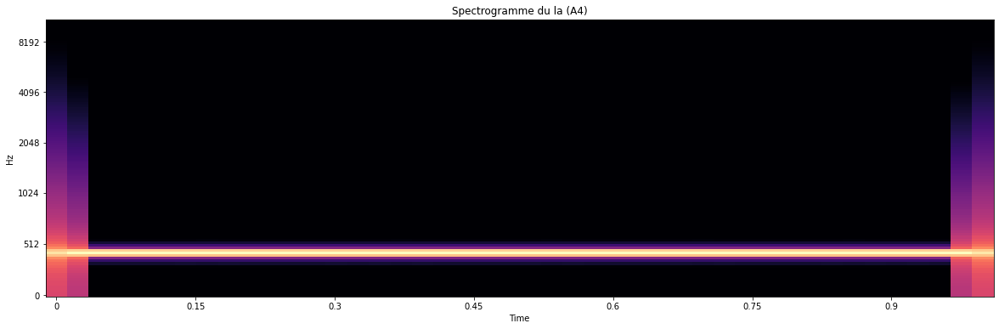

In [143]:
tone = librosa.tone(440, duration=1)
S = librosa.feature.melspectrogram(y=tone)
# Spectrogramme basé sur l’échelle des mels (https://fr.wikipedia.org/wiki/%C3%89chelle_des_mels)
# Voir https://librosa.org/doc/latest/generated/librosa.feature.melspectrogram.html#librosa.feature.melspectrogram


plt.figure(figsize=(20, 6))
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis='time', y_axis='mel')
plt.title('Spectrogramme du la (A4)')
plt.xlabel('Time')
plt.ylabel('Hz')
plt.show()

librosa permet une analyse chromatique d’un enregistrement. La gamme chromatique est une échelle musicale composée de douze degrés. L’analyse chromatique permet de déterminer quel est le degré d’un ensemble de *samples*.

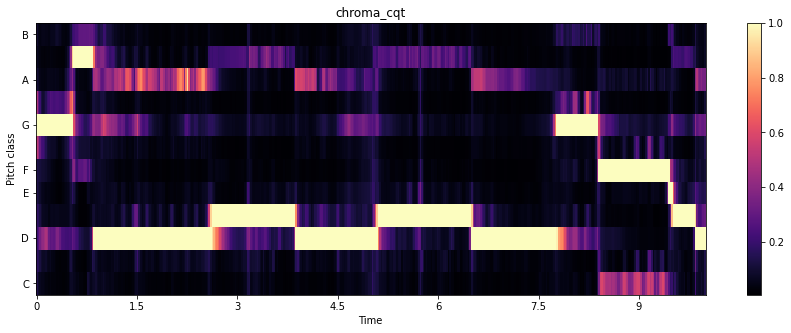

In [227]:
y, sr = librosa.load("../audio/electric_cello.wav", duration=10)

chroma_cq = librosa.feature.chroma_cqt(y=y, sr=sr)

fig, ax = plt.subplots(sharex=True, figsize=(15,5))
img = librosa.display.specshow(chroma_cq, y_axis='chroma', x_axis='time', ax=ax)
ax.set(title='chroma_cqt')
fig.colorbar(img, ax=ax)

In [228]:
Audio(data=y, rate=sr)

## Séparation composants harmoniques et percussifs

À partir du spectrogramme librosa peut séparer harmonie et percussions.

In [67]:
y, sr = librosa.load(librosa.ex("nutcracker"), duration=5, offset=15)
D = librosa.stft(y)
D_harmonic, D_percussive = librosa.decompose.hpss(D)

Audio(data=y, rate=sr)

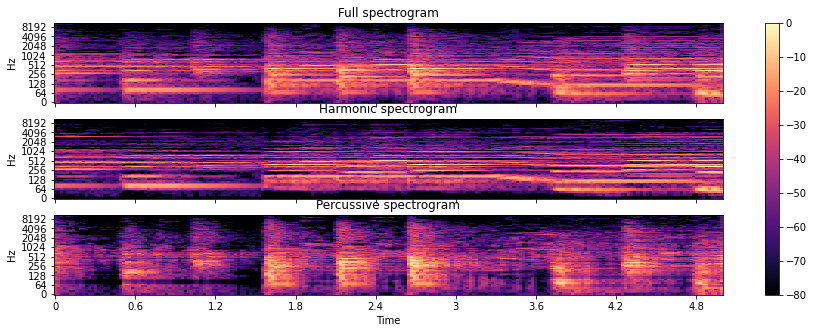

In [222]:
# Affichage des 3 spectrogrammes : complet, harmonie et percussions
rp = np.max(np.abs(D))

fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True, figsize=(15,5))

img = librosa.display.specshow(librosa.amplitude_to_db(np.abs(D), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[0])
ax[0].set(title='Full spectrogram')
ax[0].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_harmonic), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='Harmonic spectrogram')
ax[1].label_outer()

librosa.display.specshow(librosa.amplitude_to_db(np.abs(D_percussive), ref=rp),
                         y_axis='log', x_axis='time', ax=ax[2])
ax[2].set(title='Percussive spectrogram')
fig.colorbar(img, ax=ax)

Grâce à la transformée de Fourier inverse on peut même générer les données audio à partir du spectrogramme et écouter les deux composants isolés.

In [223]:
y_harmonic = librosa.istft(D_harmonic, length=len(y))
Audio(data=y_harmonic, rate=sr)

In [224]:
y_percussive = librosa.istft(D_percussive, length=len(y))
Audio(data=y_percussive, rate=sr)

### Afficher les notes sur l’échelle chromatique du composant harmonique

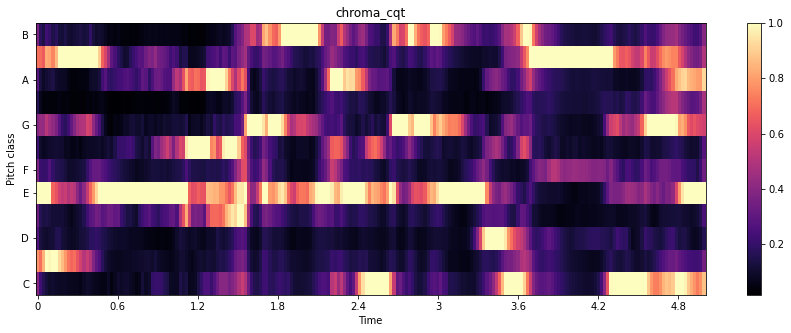

In [225]:
y, sr = librosa.load(librosa.ex("nutcracker"), duration=5, offset=15) # chargement du fichier audio en données signal
D = librosa.stft(y) # données signal vers spectrogramme (avec transformée de Fourier (stft))
D_harmonic, D_percussive = librosa.decompose.hpss(D) # décomposition harmonie/percussion. On travaille sur les spectrogrammes
y_harmonic = librosa.istft(D_harmonic, length=len(y)) # spectrogramme -> données signal avec transformée inverse (istft)

chroma_cq = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr) # analyse chromatique (c-a-d reconnaissance des notes)

fig, ax = plt.subplots(sharex=True, figsize=(15,5))
img = librosa.display.specshow(chroma_cq, y_axis='chroma', x_axis='time', ax=ax)
ax.set(title='chroma_cqt')
fig.colorbar(img, ax=ax)

In [226]:
Audio(data=y_harmonic, rate=sr)

### Générer des notes

In [15]:
import librosa
import numpy as np

def generate_note(freq, duration=0.5, sample_rate=22050):
    """Génère un son sinusoïdal pour une fréquence donnée"""
    t = np.linspace(0, duration, int(sample_rate * duration), False)
    return 0.5 * np.sin(2 * np.pi * freq * t)

def note_to_frequency(note):
    """Convertit un nom de note en fréquence"""
    # Dictionnaire des fréquences pour différentes notes
    note_freq = {
        'C4': 261.63, 'C#4': 277.18, 'D4': 293.66, 
        'D#4': 311.13, 'E4': 329.63, 'F4': 349.23, 
        'F#4': 369.99, 'G4': 392.00, 'G#4': 415.30, 
        'A4': 440.00, 'A#4': 466.16, 'B4': 493.88,
        'Bb3': 233.08, 'F3': 174.61, 'G3': 196.00, 
        'E3': 164.81
    }
    return note_freq.get(note, 440)  # Valeur par défaut : A4

def play_sequence(notes, durations=None, sample_rate=22050):
    """Génère une séquence de notes pour IPython.display"""
    if durations is None:
        durations = [0.5] * len(notes)
    
    # Générer la séquence audio
    sequence = []
    for note, duration in zip(notes, durations):
        freq = note_to_frequency(note)
        note_sound = generate_note(freq, duration, sample_rate)
        sequence.extend(note_sound)
        
    # Retourne un objet Audio pour Jupyter
    return Audio(sequence, rate=sample_rate)

In [16]:
# Génération de la séquence Bb - F - G - E
notes_sequence = ['Bb3', 'F4', 'G3', 'E4']
sequence = play_sequence(notes_sequence)
display(sequence)

### Filtre ala French Touch

Nous allons commencer par définir un fonction `low_pass_filter` pour atténuer les fréquences supérieures à un certain seuil.  
Ce filtre « coupe » les fréquences aigües en quelque sorte.

In [89]:
from scipy.signal import butter, filtfilt, lfilter

# Define a low-pass filter
def low_pass_filter(data, cutoff, fs, order=4):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, data, padlen=1)

# Vous pouvez modifier le fichier son à filtrer
y, sr = librosa.load("../audio/electric_cello.wav")

# Apply low-pass filter
cutoff_freq = 400  # Modifiez le seuil ici
filtered_y = low_pass_filter(y, cutoff_freq, sr)

display(Audio(filtered_y, rate=sr))


Avec une visualisation ça sera plus parlant

/tmp/ipykernel_17666/185004717.py:6: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(y), ref=np.max),
/tmp/ipykernel_17666/185004717.py:11: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(filtered_y), ref=np.max),


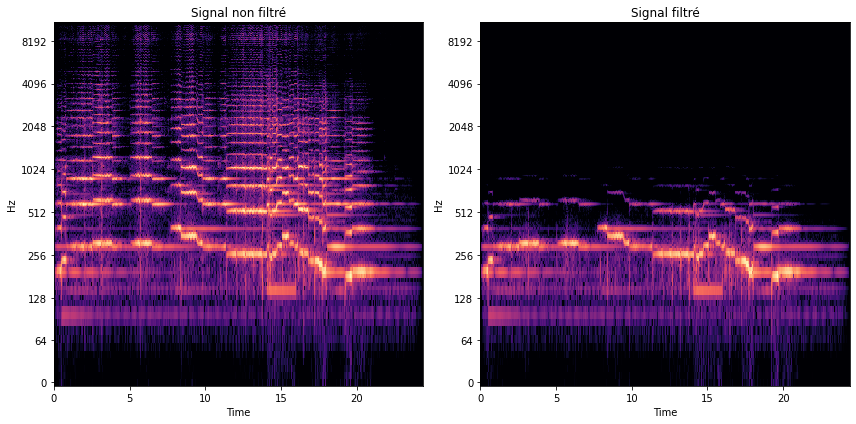

In [87]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot the first spectrogram
librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(y), ref=np.max), 
                         sr=sr, x_axis='time', y_axis='log', ax=axes[0])
axes[0].set_title("Signal non filtré")

# Plot the second spectrogram
librosa.display.specshow(librosa.amplitude_to_db(librosa.stft(filtered_y), ref=np.max), 
                         sr=sr, x_axis='time', y_axis='log', ax=axes[1])
axes[1].set_title("Signal filtré")

# Display the plots
plt.tight_layout()
plt.show()

Une tentative de filtre dynamique ala French Touch : on déplace le filtre sur le signal en faisant varier le seuil.

In [90]:
from scipy.signal import butter, sosfilt

def dynamic_low_pass(data, sr, min_cutoff, max_cutoff, sweep_duration, order=4):
    n_samples = len(data)
    sweep_samples = min(n_samples, int(sweep_duration * sr))

    # Create a linear sweep of cutoff frequencies
    cutoff_values = np.linspace(min_cutoff, max_cutoff, sweep_samples)
    nyquist = 0.5 * sr

    # Pre-allocate output
    output = np.zeros_like(data)

    # Process in chunks
    start = 0
    for i in range(1, len(cutoff_values), sr // 10):  # Process in chunks every 0.1 sec
        cutoff = cutoff_values[i]
        normal_cutoff = cutoff / nyquist
        
        # Design low-pass filter
        sos = butter(order, normal_cutoff, btype='low', output='sos')
        
        # Apply filter in chunks
        end = min(i, n_samples)
        output[start:end] = sosfilt(sos, data[start:end])
        start = end

    return output

# Apply a filter sweep
min_cutoff = 100
max_cutoff = 5000
y, sr = librosa.load(librosa.ex('vibeace'), duration=10)
sweep_duration = len(y) / sr  # Full track length

swept_y = dynamic_low_pass(y, sr, min_cutoff, max_cutoff, sweep_duration)

display(Audio(swept_y, rate=sr))
